In [1]:
from sqlalchemy import create_engine
import pandas as pd
import numpy as np
import getpass
from collections import defaultdict
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
passw = getpass.getpass("Password Please: ")

Password Please: ········


In [3]:
cnx = create_engine('postgresql://adam:%s@54.164.65.127:5432/baseball'%passw)

In [4]:
appearances = pd.read_sql_query("select * from appearances;",cnx)

In [5]:
first_appearance_dict = defaultdict(list)

In [6]:
for player_id, df in appearances.groupby(['player_id']):
    first_appearance_dict[df.iloc[0].year].append(player_id)

In [230]:
batting = pd.read_sql_query("select * from batting;",cnx)
fielding = pd.read_sql_query("select * from fielding;",cnx)
pitching = pd.read_sql_query("select * from pitching;",cnx)
hall_of_fame = pd.read_sql_query("select * from hall_of_fame;",cnx)

In [231]:
hall = set(hall_of_fame[(hall_of_fame.inducted=='Y') & 
                        (hall_of_fame.category=='Player') & 
                        (hall_of_fame.votedby!='Negro League')].player_id)

In [232]:
len(hall)

226

In [233]:
def get_bound(k,n,z=2.58):
    if k==0:
        return 0
    if k>n:
        k = n
    k,n = float(k),float(n)
    try:
        p_hat = k/n
    except:
        return 0.0
    lower_bound = (p_hat + z**2 / (2*n) - z * ((p_hat*(1-p_hat) + z**2/(4*n))/n)**.5)/(1+z**2/n)
    return lower_bound

In [234]:
positions = appearances.groupby('player_id',as_index=True) \
                       .sum() \
                       .iloc[:,range(5,14)+range(15,18)] \
                       .idxmax(axis=1) \
                       .to_dict()

In [235]:
batting.insert(1,'position',[positions[p][2:] if p in positions else np.nan for p in batting.player_id])
fielding.insert(1,'position',[positions[p][2:] if p in positions else np.nan for p in fielding.player_id])
pitching.insert(1,'position',[positions[p][2:] if p in positions else np.nan for p in pitching.player_id])

In [236]:
batting = batting.fillna(0)
fielding = fielding.fillna(0)
pitching = pitching.fillna(0)

In [272]:
fielding.columns

Index([u'player_id',  u'position',      u'year',     u'stint',   u'team_id',
       u'league_id',       u'pos',         u'g',        u'gs',  u'inn_outs',
              u'po',         u'a',         u'e',        u'dp',        u'pb',
              u'wp',        u'sb',        u'cs',        u'zr'],
      dtype='object')

In [273]:
fielding.head()

,player_id,position,year,stint,team_id,league_id,pos,g,gs,inn_outs,po,a,e,dp,pb,wp,sb,cs,zr
0,abercda01,ss,1871,1,TRO,NA,SS,1,0.0,0.0,1.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
1,addybo01,rf,1871,1,RC1,NA,2B,22,0.0,0.0,67.0,72.0,42.0,5.0,0.0,0.0,0.0,0.0,0.0
2,addybo01,rf,1871,1,RC1,NA,SS,3,0.0,0.0,8.0,14.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0
3,allisar01,rf,1871,1,CL1,NA,2B,2,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,allisar01,rf,1871,1,CL1,NA,OF,29,0.0,0.0,51.0,3.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0


In [280]:
## batting feature engineering
def add_batting_features(df):
    df.insert(len(df.columns),'ave',[get_bound(h,ab) for h,ab in zip(df.h,df.ab)])
    df.insert(len(df.columns),'double_ave',[get_bound(double,ab) for double,ab in zip(df.double,df.ab)])
    df.insert(len(df.columns),'triple_ave',[get_bound(triple,ab) for triple,ab in zip(df.triple,df.ab)])
    df.insert(len(df.columns),'hr_ave',[get_bound(hr,ab) for hr,ab in zip(df.hr,df.ab)])
    df.insert(len(df.columns),'bb_ave',[get_bound(bb,ab) for bb,ab in zip(df.bb,df.ab)])
    df.insert(len(df.columns),'so_ave',[get_bound(so,ab) for so,ab in zip(df.so,df.ab)])
    df.insert(len(df.columns),'r_ave',[get_bound(r,ab) for r,ab in zip(df.r,df.ab)])
    df.insert(len(df.columns),'rbi_ave',[get_bound(rbi,ab) for rbi,ab in zip(df.rbi,df.ab)])
    df.insert(len(df.columns),'tb',df.double + df.triple*2 + df.hr*3 + df.h + df.bb + df.ibb + df.hbp)
    df.insert(len(df.columns),'steal',[get_bound(sb,sb+cs) for sb,cs in zip(df.sb,df.cs)])
    df.insert(0,'position',[positions[p][2:] if p in positions else np.nan for p in df.player_id])
    return df

## fielding feature engineering
def add_fielding_features(df):
    df.insert(len(df.columns),'fielding_ave',[get_bound(po+a,po+a+e) for po,a,e in zip(df.po,df.a,df.e)])
    df.insert(len(df.columns),'range_fact',[get_bound(po+a,inout) for po,a,inout in zip(df.po,df.a,df.inn_outs)])
    df.insert(len(df.columns),'cs_ave',[get_bound(cs,sb+cs) for cs,sb in zip(df.cs,df.sb)])
    df.insert(0,'position',[positions[p][2:] if p in positions else np.nan for p in df.player_id])
    return df

In [281]:
batting_cols = ['g','ab','r','r_ave','h','ave','double','double_ave','triple','triple_ave','hr','hr_ave',
                'bb','bb_ave','so_ave','tb','rbi','sb','steal','ibb']
fielding_cols = ['po','a','e','dp','fielding_ave','range_fact']
catching_cols = ['pb','wp','sb','cs','cs_ave']

In [282]:
dfs = []
for start in range(1871,2007):
    if start%10==0:
        print start
    batting_subset = batting[batting.year.isin(range(start,start+10))].groupby('player_id',as_index=False).sum()
    batting_subset = add_batting_features(batting_subset)
    
    batting_pos = pd.unique(batting_subset.position).tolist()
    for col in batting_cols:
        batting_subset.insert(len(batting_subset.columns),'rank_overall_%s' % col,batting_subset[col].rank(pct=True))
    
#     fielding_subset = fielding[fielding.year.isin(range(start,start+10))].groupby('player_id',as_index=False).sum()
#     fielding_subset = add_fielding_features(fielding_subset)
#     for col in fielding_cols:
#         fielding_subset.insert(len(fielding_subset.columns),'rank_overall_%s' % col,fielding_subset[col].rank(pct=True))
#     for pos
    
    #pitching_subset = pitching[pitching.year.isin(range(start,start+10))].groupby(['player_id','position'],as_index=False).sum()
    
    for position in batting_pos:
        batting_subset.insert(len(batting_subset.columns),'dummy_%s' % position,
                              [1 if pos==position else 0 for pos in batting_subset.position])
    for position in batting_pos:
        for col in batting_cols:
            batting_subset.insert(len(batting_subset.columns),'%s_rank_%s' % (col,position),
                                  batting_subset[batting_subset.position==position][col].rank(pct=True))
    d = {}
    n_feature_cols = len(batting_cols) + len(batting_pos) + len(batting_pos)*len(batting_cols)
    for player in first_appearance_dict[start]:
        if len(batting_subset[batting_subset.player_id==player])==0:
            continue
        d[player] = batting_subset[batting_subset.player_id==player].values[:,-n_feature_cols:].tolist()[0]
    df = pd.DataFrame(d).T
    df.insert(0,'first_year',[start]*len(df))
    columns = ['first_year']
    for col in batting_cols:
        columns += ['rank_overall_%s' % col]
    for position in batting_pos:
        columns += ['dummy_%s' % position]
    for position in batting_pos:
        for col in batting_cols:
            columns += ['%s_rank_%s' % (col,position)]
    df.columns = columns
    dfs.append(df)

1880
1890
1900
1910
1920
1930
1940
1950
1960
1970
1980
1990
2000


In [283]:
df = pd.concat(dfs)[columns]

In [284]:
df.insert(0,'hall',[1 if p in hall else 0 for p in df.index])

In [285]:
df = df.fillna(0)

In [286]:
df.head()

,hall,first_year,rank_overall_g,rank_overall_ab,rank_overall_r,rank_overall_r_ave,rank_overall_h,rank_overall_ave,rank_overall_double,rank_overall_double_ave,...,hr_rank_dh,hr_ave_rank_dh,bb_rank_dh,bb_ave_rank_dh,so_ave_rank_dh,tb_rank_dh,rbi_rank_dh,sb_rank_dh,steal_rank_dh,ibb_rank_dh
abercda01,0,1871,0.075820,0.088115,0.078893,0.078893,0.061475,0.061475,0.169057,0.169057,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
addybo01,0,1871,0.903689,0.901639,0.918033,0.885246,0.911885,0.907787,0.880123,0.766393,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
allisar01,0,1871,0.820697,0.831967,0.827869,0.760246,0.825820,0.813525,0.784836,0.678279,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
allisdo01,0,1871,0.924180,0.922131,0.921107,0.858607,0.926230,0.889344,0.908811,0.813525,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ansonca01,1,1871,0.991803,0.989754,0.991803,0.965164,1.000000,0.995902,0.997951,0.981557,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


1b
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74]


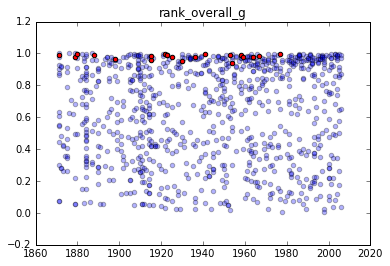

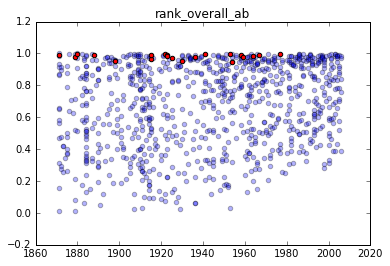

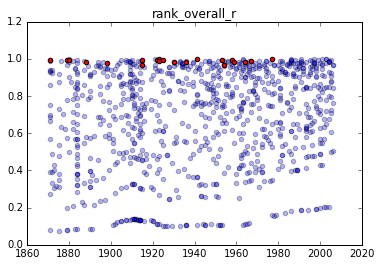

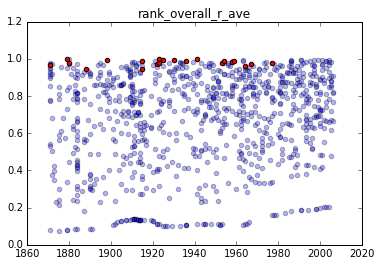

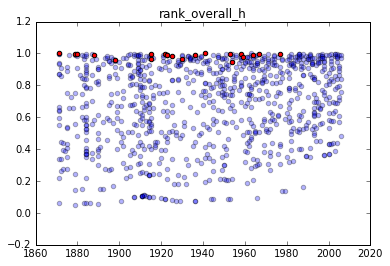

...

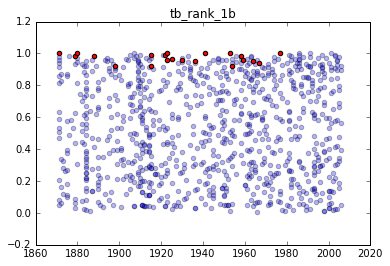

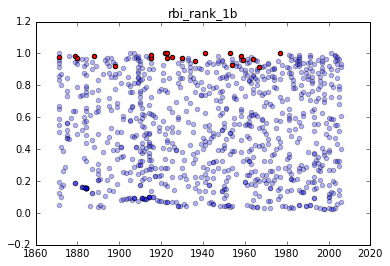

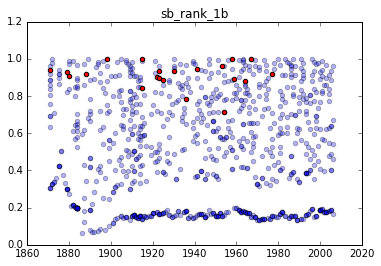

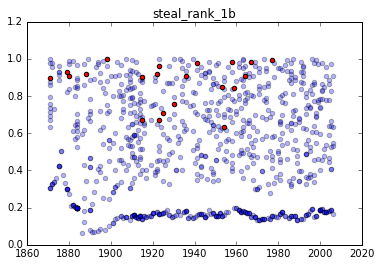

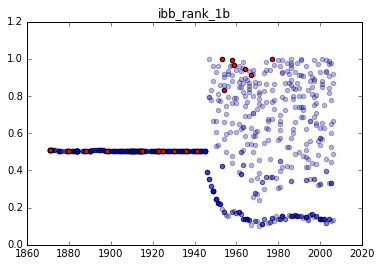

cf
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 24, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94]


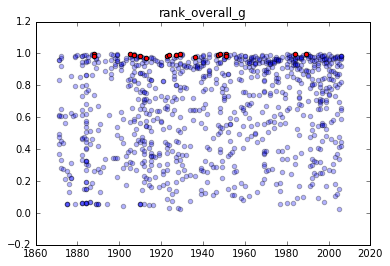

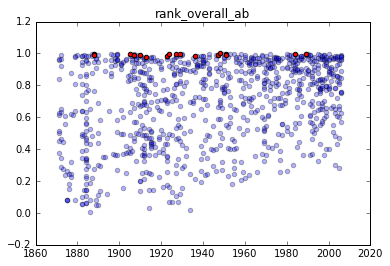

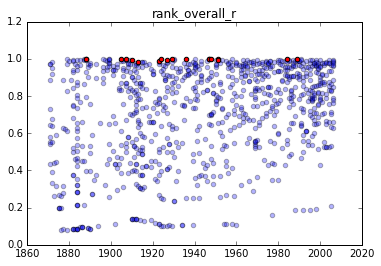

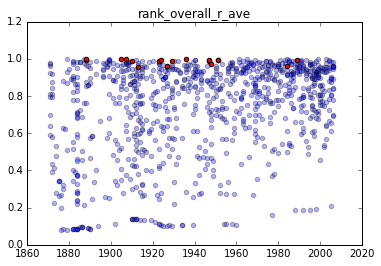

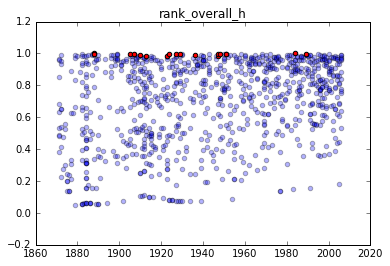

...

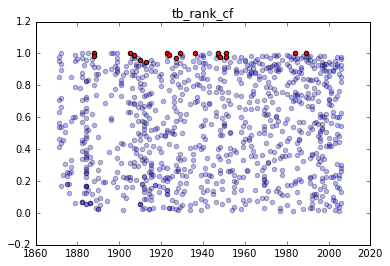

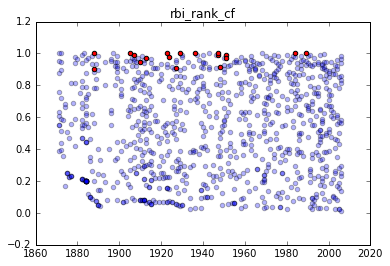

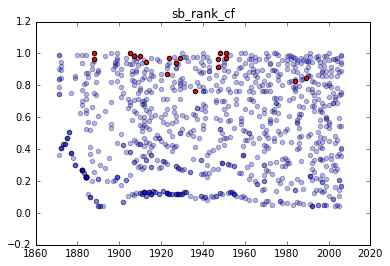

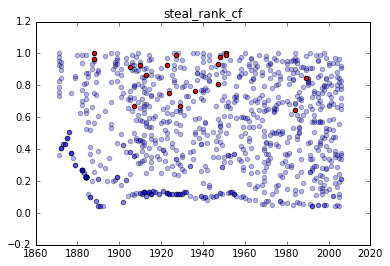

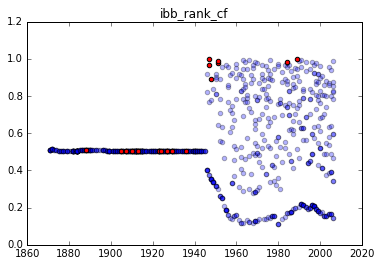

rf
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 25, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114]


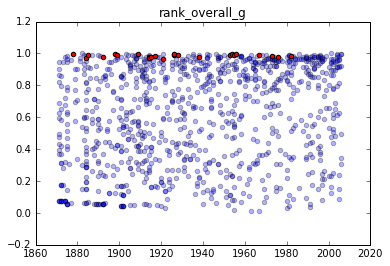

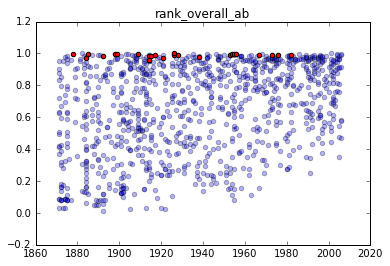

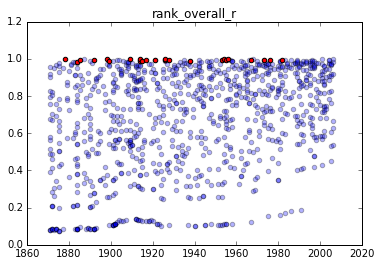

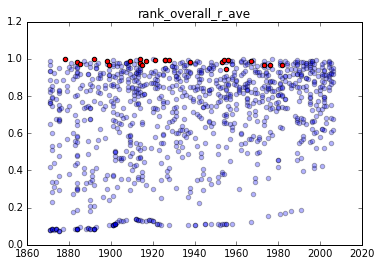

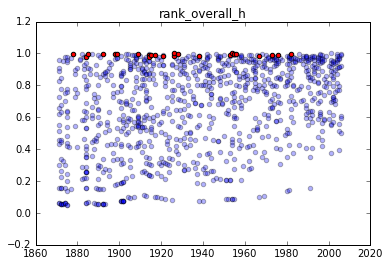

...

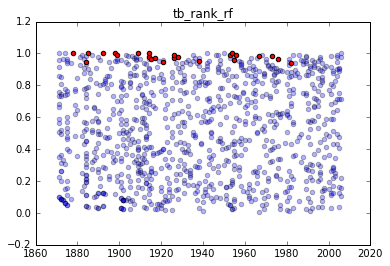

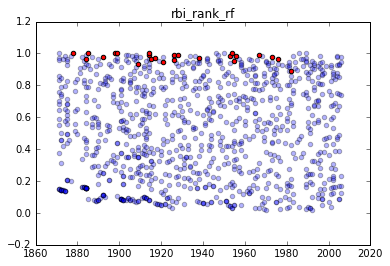

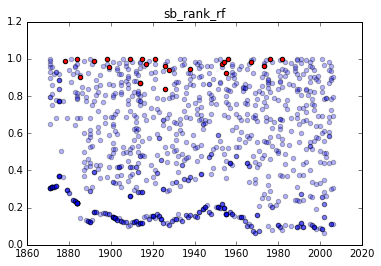

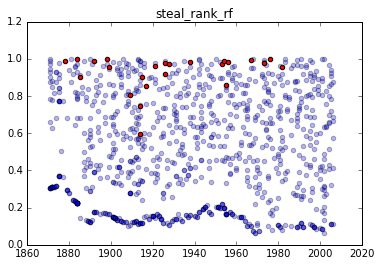

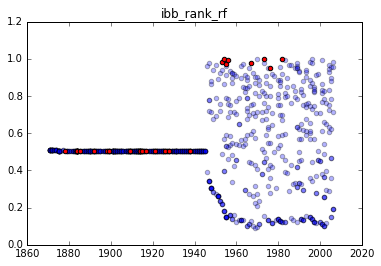

2b
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 26, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134]


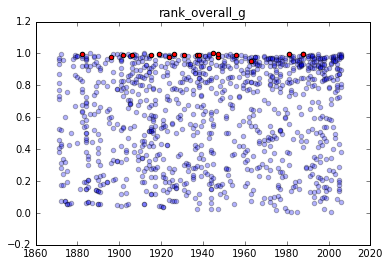

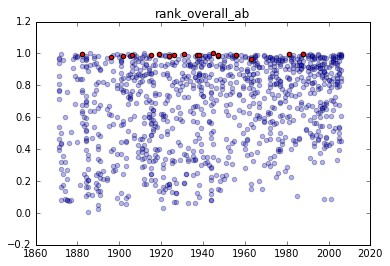

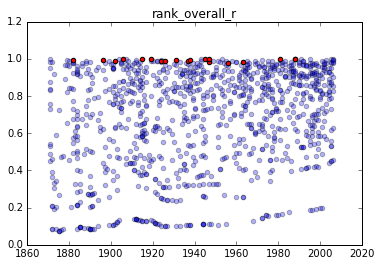

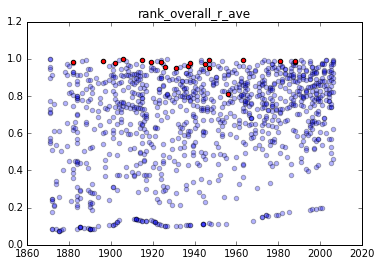

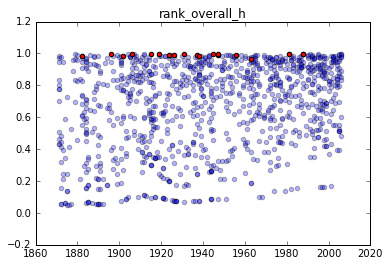

...

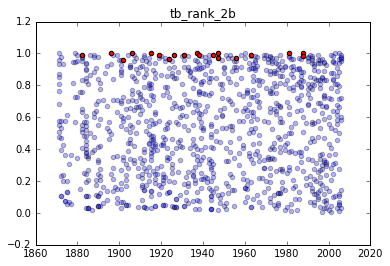

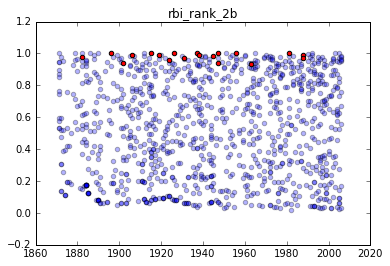

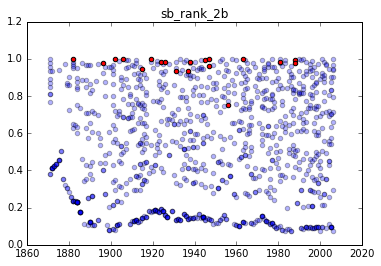

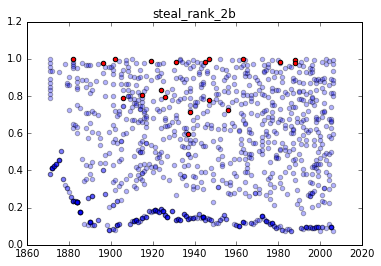

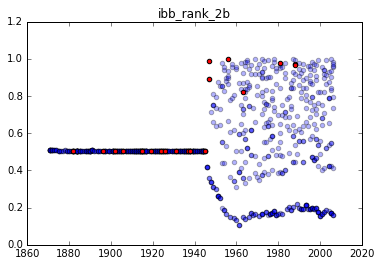

ss
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 27, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154]


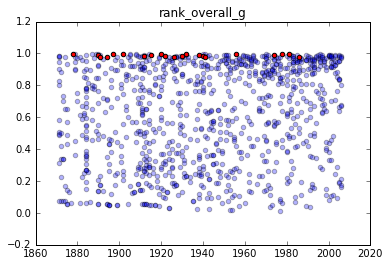

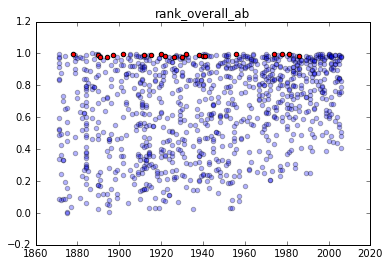

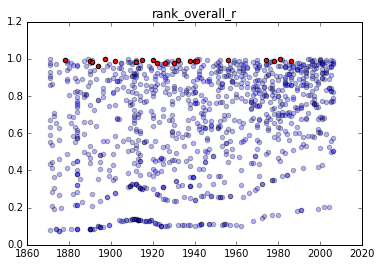

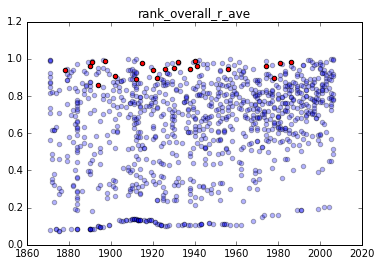

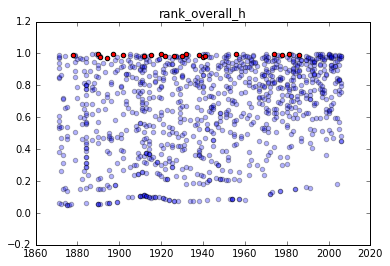

...

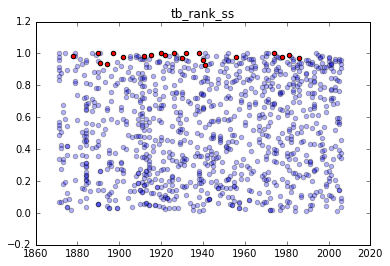

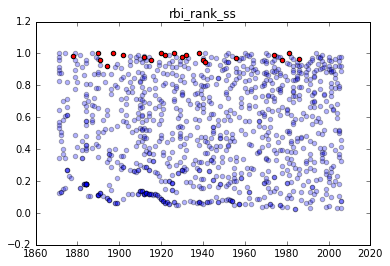

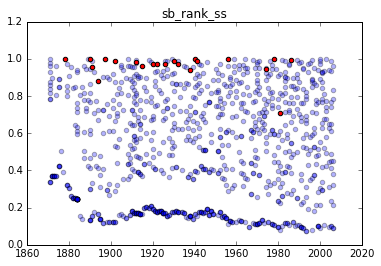

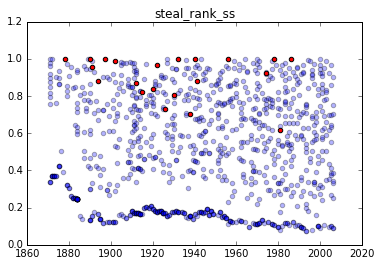

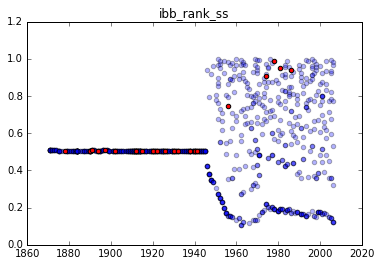

3b
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 28, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174]


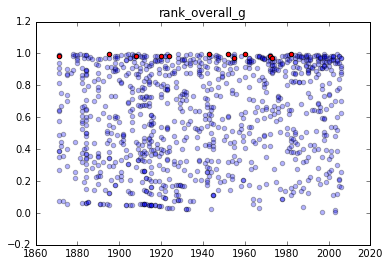

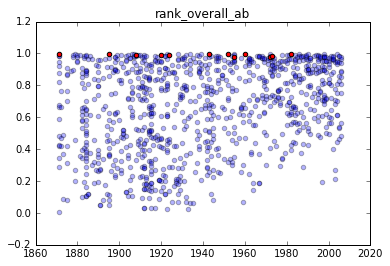

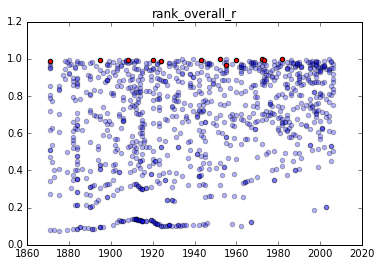

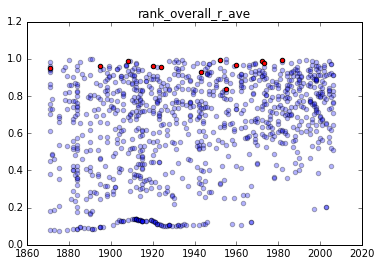

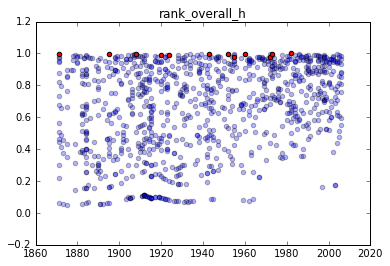

...

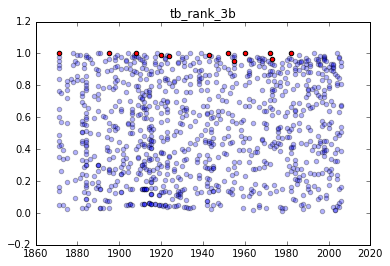

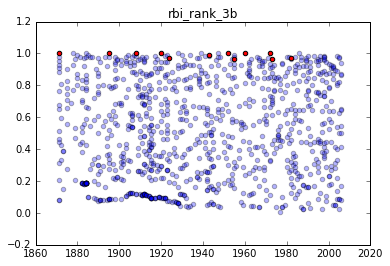

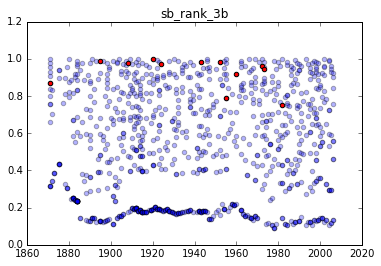

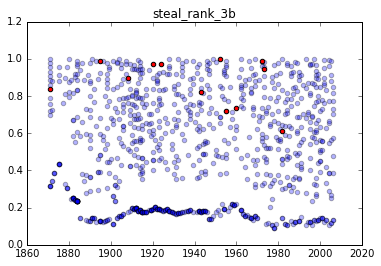

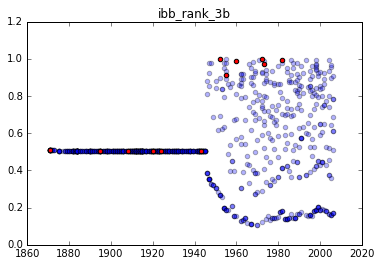

pr
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 29, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194]


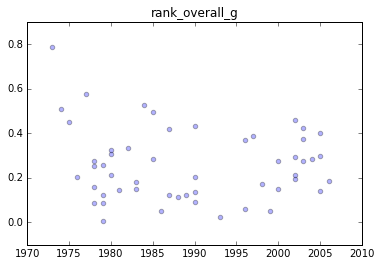

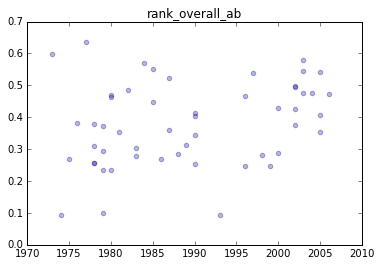

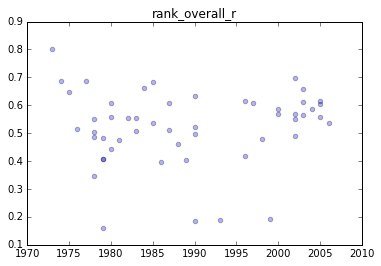

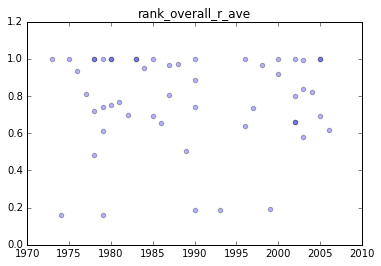

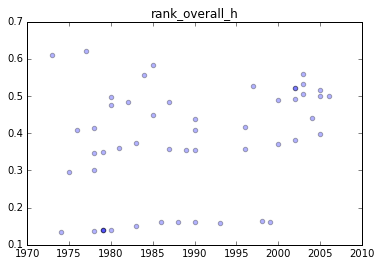

...

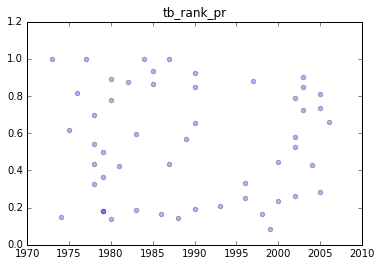

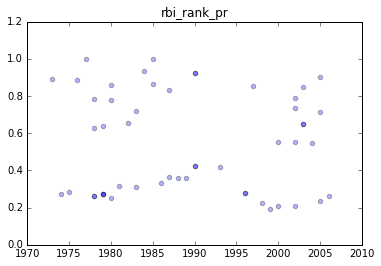

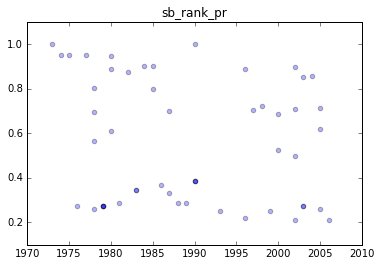

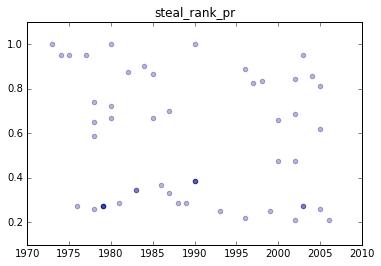

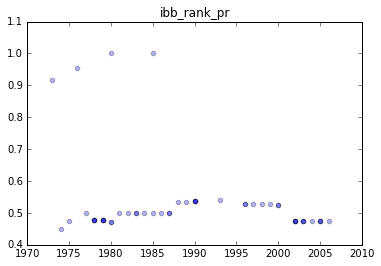

lf
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 30, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214]


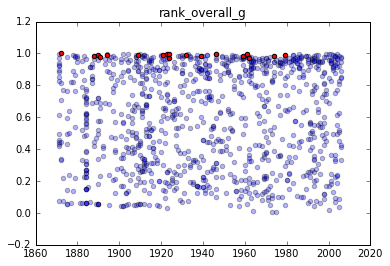

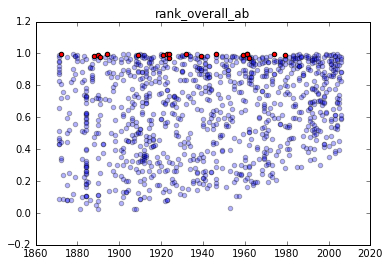

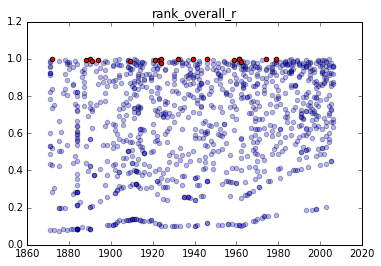

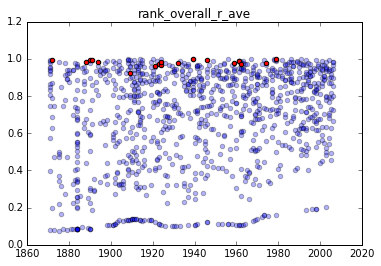

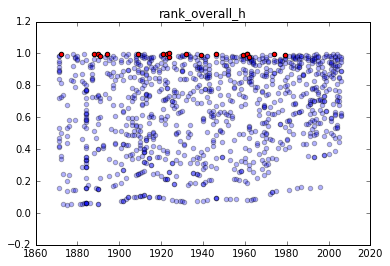

...

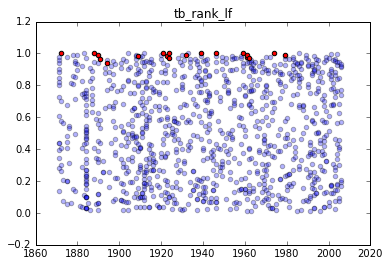

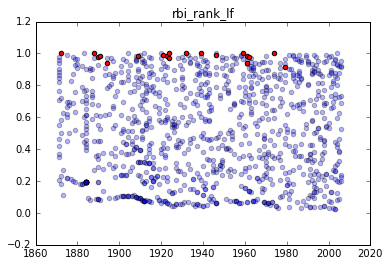

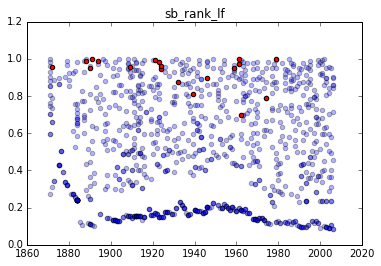

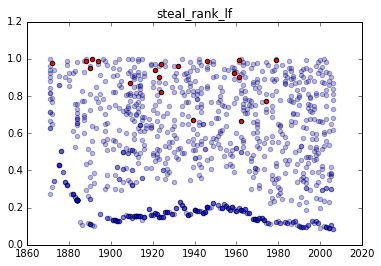

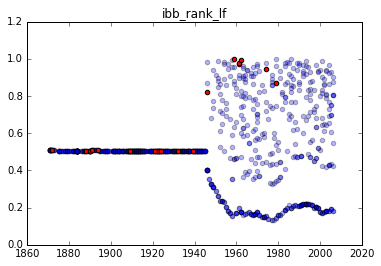

c
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 31, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234]


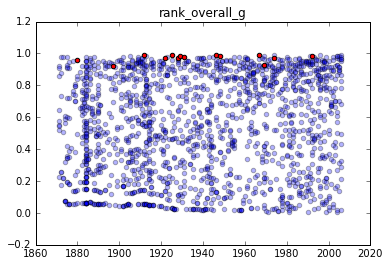

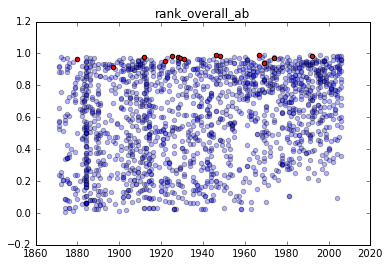

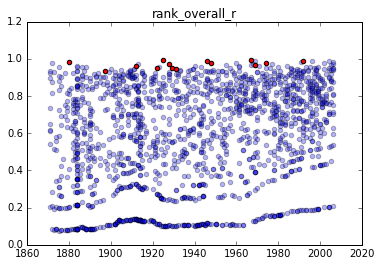

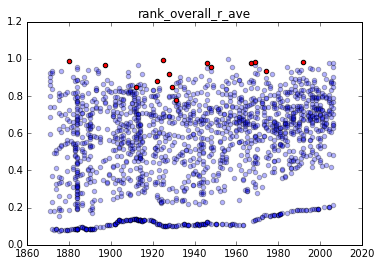

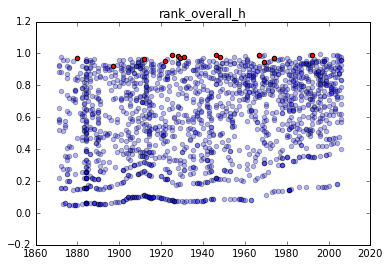

...

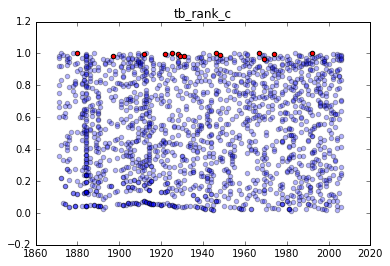

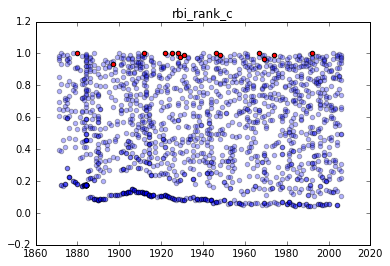

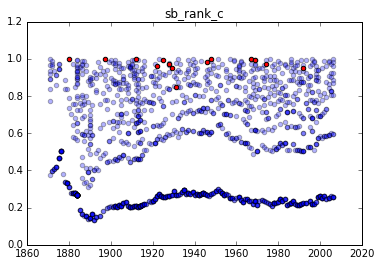

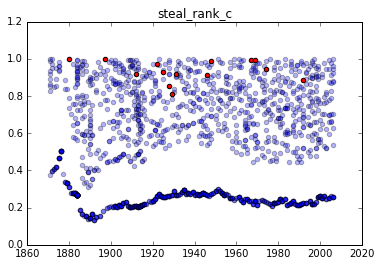

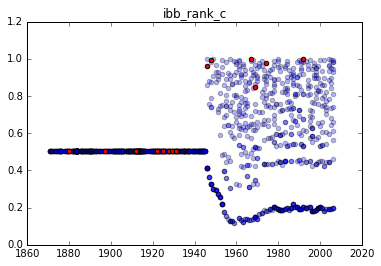

ph
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 32, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254]


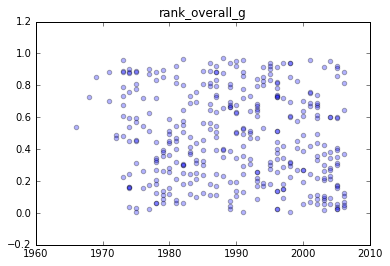

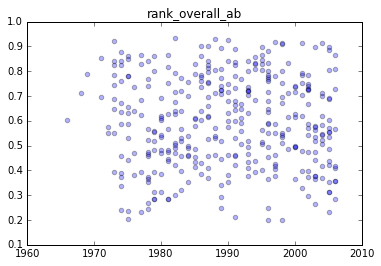

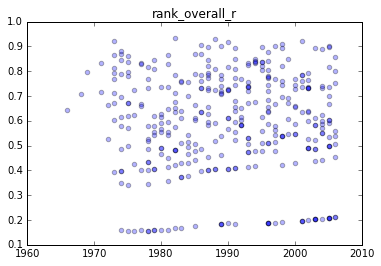

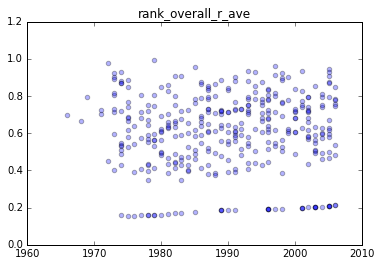

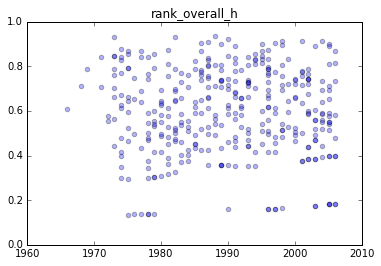

...

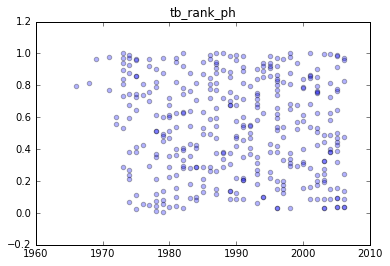

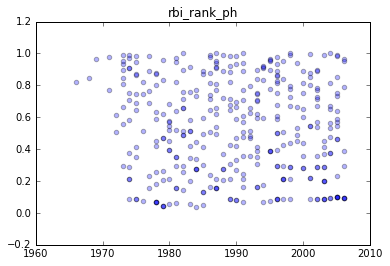

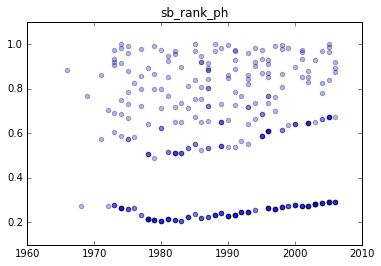

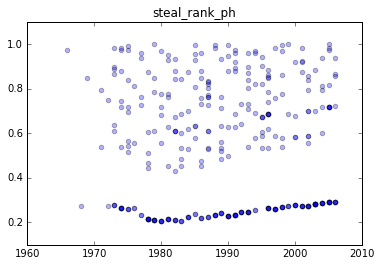

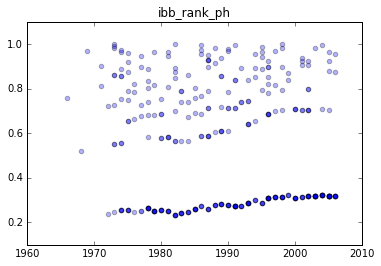

nan


TypeError: endswith first arg must be str, unicode, or tuple, not float

In [287]:
for pos in batting_pos[1:]:
    print pos
    overall_cols = [u for u,col in enumerate(df.columns) if col.endswith(pos) or 'overall' in col]
    print overall_cols
    for col in overall_cols:
        plt.scatter(df[(df.hall==0) & (df['dummy_%s'%pos]==1)].first_year,df[(df.hall==0) & (df['dummy_%s'%pos]==1)].iloc[:,col],c='b',alpha=.3);
        plt.scatter(df[(df.hall==1) & (df['dummy_%s'%pos]==1)].first_year,df[(df.hall==1) & (df['dummy_%s'%pos]==1)].iloc[:,col],c='r');
        plt.title(df.columns[col]);
        plt.show()

In [293]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve, auc

In [296]:
#clf = ExtraTreesClassifier(n_estimators=5000, criterion='gini', max_depth=None, 
#                            min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, 
#                            max_features='auto', max_leaf_nodes=None, bootstrap=True, 
#                            oob_score=True, n_jobs=-1, random_state=23, verbose=0, 
#                            warm_start=False, class_weight=None)

clf = RandomForestClassifier(n_estimators=700, criterion='gini', max_depth=15, min_samples_split=2, 
                             min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', 
                             max_leaf_nodes=None, bootstrap=True, oob_score=True, n_jobs=-1, 
                             random_state=23, verbose=0, warm_start=False, class_weight=None)

In [297]:
for pos in batting_pos[1:]:
    if df[df['dummy_%s'%pos]==1].hall.sum()==0:
        continue
    cols = ['hall','first_year'] + [col for col in df.columns if col.endswith(pos) or col.endswith('overall')]
    sub = df[df['dummy_%s'%pos]==1][cols]
    clf.fit(sub.values[:,1:],sub.values[:,0])
    y_pred = (clf.oob_decision_function_[:,1]>.2).astype(int)
    y_true = sub.hall.values
    print pos
    print 1-sum(sub.hall)/float(len(sub))
    print clf.oob_score_
    print classification_report(y_true, y_pred)

1b
0.976846747519
0.980154355017
             precision    recall  f1-score   support

          0       0.99      0.97      0.98       886
          1       0.35      0.67      0.46        21

avg / total       0.98      0.96      0.97       907

cf
0.980561555076
0.98596112311
             precision    recall  f1-score   support

          0       0.99      0.98      0.98       908
          1       0.35      0.67      0.46        18

avg / total       0.98      0.97      0.97       926

rf
0.975975975976
0.975975975976
             precision    recall  f1-score   support

          0       0.99      0.97      0.98       975
          1       0.38      0.71      0.49        24

avg / total       0.98      0.96      0.97       999

2b
0.981852913085
0.981852913085
             precision    recall  f1-score   support

          0       1.00      0.98      0.99      1028
          1       0.41      0.74      0.53        19

avg / total       0.98      0.98      0.98      1047

ss
0.9791

In [316]:
print confusion_matrix(y_true,y_pred)

[[16401    16]
 [  193    25]]


In [337]:
roc_auc_score(y_true,clf.oob_decision_function_[:,1])

0.9714327506785595

In [344]:
fpr, tpr, _ = roc_curve(y_true, clf.oob_decision_function_[:,1])
roc_auc = auc(fpr, tpr)

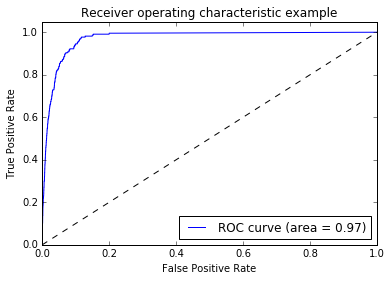

In [345]:
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()